# Load File and Clean Data

In [1]:
#install packages as needed
# !pip3 install geopandas
!pip3 install plotly

In [2]:
#load packages needed
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px


In [3]:
#load dataset
mass_shooting_df = pd.read_csv('mass_shootings.csv')

In [4]:
mass_shooting_df.head()

,CaseID,Title,Location,City,State,Latitude,Longitude,Number of Victim Fatalities,Total Number of Fatalities,Number of Victims Injured,...,History of Mental Illness - General,Data Source 1,Data Source 2,Data Source 3,Data Source 4,Data Source 5,Data Source 6,Data Source 7,Military Experience,Class
0,1,University of Texas at Austin,"Austin, Texas",Austin,Texas,30.198887,-97.844159,16,17,32,...,Yes,http://en.wikipedia.org/wiki/Charles_Whitman,"Lexington Examiner (KY) - September 23, 2012",http://news.google.com/newspapers?id=lkk0AAAAI...,http://news.google.com/newspapers?id=PPUjAAAAI...,http://books.google.com/books?id=ClYEAAAAMBAJ&...,NaN,NaN,Yes,SPK
1,2,Rose-Mar College of Beauty,"Mesa, Arizona",Mesa,Arizona,33.422687,-111.816320,5,5,1,...,Yes,"""Slaughter In The College Of Beauty."" Time 88....",Section: Lexington True Crime Examiner,http://www.nydailynews.com/news/crime/beauty-s...,http://books.google.com/books?id=Cre7qsswRiwC&...,NaN,NaN,NaN,Unknown,MS
2,3,New Orleans Police Shootings,"New Orleans, Louisiana",New Orleans,Louisiana,30.068724,-89.931474,9,10,13,...,Yes,http://news.google.com/newspapers?nid=1144&dat...,http://theadvocate.com/home/4828836-125/rampag...,http://www.trutv.com/library/crime/notorious_m...,http://books.google.com/books?id=TfEDmROcZwEC&...,NaN,NaN,NaN,Unknown,SPK
3,4,Clara Barton Elementary School,"Chicago, Illinois",Chicago,Illinois,41.839280,-87.688181,1,1,3,...,Yes,http://news.google.com/newspapers?nid=1338&dat...,http://news.google.com/newspapers?nid=1144&dat...,http://www.leagle.com/xmlResult.aspx?page=1&xm...,NaN,NaN,NaN,NaN,Unknown,MS
4,5,Olean High School,"Olean, New York",Olean,New York,42.081854,-78.432139,3,3,7,...,No,http://buffalo.ynn.com/content/top_stories/622...,School Shootings: a History Part One of a seri...,http://www.newswithviews.com/Erica/Carle10.htm,http://books.google.com/books?id=ZuKoSskEWyIC&...,"""Olean High School Shooting"". Larrie Benton Za...",NaN,NaN,Unknown,MS


In [5]:
#view how many variables and observations are in the dataset 
mass_shooting_df.shape

(307, 48)

There are 307 observations and 48 variables in the dataset. This is incredibly noisy so we are only going to focus on a select few variables.

In [6]:
#keep only the columns of interest
mass_shooting_df2 = mass_shooting_df[['State','Latitude','Longitude', 'Total Number of Victims', 'Military Experience', 
                                      'Day of Week', 'Date','Average Shooter Age', 'Shooter Sex', 'Shooter Race',
                                      'Type of Gun - General', 'History of Mental Illness - General', 
                                      'Possible Motive - Detailed']]

In [7]:
mass_shooting_df2.head()

,State,Latitude,Longitude,Total Number of Victims,Military Experience,Day of Week,Date,Average Shooter Age,Shooter Sex,Shooter Race,Type of Gun - General,History of Mental Illness - General,Possible Motive - Detailed
0,Texas,30.198887,-97.844159,48,Yes,Monday,8/1/1966,25,Male,White American or European American,Multiple guns,Yes,A task force of professionals known as the Con...
1,Arizona,33.422687,-111.816320,6,Unknown,Saturday,11/12/1966,18,Male,White American or European American,Handgun,Yes,"When he was being arrested, the shooter announ..."
2,Louisiana,30.068724,-89.931474,22,Unknown,Sunday,12/31/72,23,Male,Black American or African American,Multiple guns,Yes,The shooter claimed he was subjected to two ye...
3,Illinois,41.839280,-87.688181,4,Unknown,Thursday,1/17/74,14,Male,Unknown,Handgun,Yes,"Former student, upset at being expelled and pl..."
4,New York,42.081854,-78.432139,10,Unknown,Monday,12/30/74,17,Male,White American or European American,Multiple guns,No,In a note explaining his motives Barbaro wrote...


In [8]:
#view variables and observations after removing variables
mass_shooting_df2.shape

(307, 13)

13 varibles of interest remain with 307 observations

In [9]:
#ensure all variables are expected type
mass_shooting_df2.dtypes

State                                   object
Latitude                               float64
Longitude                              float64
Total Number of Victims                  int64
Military Experience                     object
Day of Week                             object
Date                                    object
Average Shooter Age                     object
Shooter Sex                             object
Shooter Race                            object
Type of Gun - General                   object
History of Mental Illness - General     object
Possible Motive - Detailed              object
dtype: object

In [10]:
#extract year from date column and create new column
mass_shooting_df2['year'] = pd.DatetimeIndex(mass_shooting_df2['Date']).year

/var/folders/lk/vv17zpzn1jxczzyz5_5m8md00000gn/T/ipykernel_19039/2370015004.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mass_shooting_df2['year'] = pd.DatetimeIndex(mass_shooting_df2['Date']).year


In [11]:
mass_shooting_df2.head()

,State,Latitude,Longitude,Total Number of Victims,Military Experience,Day of Week,Date,Average Shooter Age,Shooter Sex,Shooter Race,Type of Gun - General,History of Mental Illness - General,Possible Motive - Detailed,year
0,Texas,30.198887,-97.844159,48,Yes,Monday,8/1/1966,25,Male,White American or European American,Multiple guns,Yes,A task force of professionals known as the Con...,1966
1,Arizona,33.422687,-111.816320,6,Unknown,Saturday,11/12/1966,18,Male,White American or European American,Handgun,Yes,"When he was being arrested, the shooter announ...",1966
2,Louisiana,30.068724,-89.931474,22,Unknown,Sunday,12/31/72,23,Male,Black American or African American,Multiple guns,Yes,The shooter claimed he was subjected to two ye...,1972
3,Illinois,41.839280,-87.688181,4,Unknown,Thursday,1/17/74,14,Male,Unknown,Handgun,Yes,"Former student, upset at being expelled and pl...",1974
4,New York,42.081854,-78.432139,10,Unknown,Monday,12/30/74,17,Male,White American or European American,Multiple guns,No,In a note explaining his motives Barbaro wrote...,1974


In [12]:
#look for outliers in year category
mass_shooting_df2['year'].value_counts()

2016    70
2015    65
2013    16
2012    14
2014    13
2007    10
1993     9
1999     7
2011     6
2009     6
2008     6
2006     6
1997     6
1988     6
1998     5
1991     5
1992     4
1994     4
1995     4
2003     3
1989     3
1996     3
1986     3
1984     3
2005     3
1983     2
2004     2
1982     2
1979     2
1976     2
1974     2
2010     2
1966     2
1985     2
2002     2
2001     2
1987     1
2071     1
2000     1
1972     1
1990     1
Name: year, dtype: int64

In [13]:
#see if there are any mistype/outliers for year category
mass_shooting_df2[mass_shooting_df2['year'] > 2016.0]

,State,Latitude,Longitude,Total Number of Victims,Military Experience,Day of Week,Date,Average Shooter Age,Shooter Sex,Shooter Race,Type of Gun - General,History of Mental Illness - General,Possible Motive - Detailed,year
150,Washington,47.673674,-117.415984,5,Unknown,Thursday,11/11/71,21,Male,White American or European American,Rifle,Yes,The father of the victim described his son as ...,2071


In [14]:
#replace value with correct value
mass_shooting_df2 = mass_shooting_df2.replace(to_replace = 2071.0, value = 2017.0)

In [15]:
#view to see if there are any mistypes for the day of the week
mass_shooting_df2['Day of Week'].value_counts()

Thursday     52
Sunday       49
Friday       49
Monday       42
Wednesday    40
Saturday     39
Tuesday      36
Name: Day of Week, dtype: int64

In [16]:
#see if there is anything of note in the Type of Gun Category
mass_shooting_df2['Type of Gun - General'].value_counts()

Handgun          133
Unknown           66
Multiple guns     58
Rifle             30
Shotgun           14
Multiple Guns      4
handgun            2
Name: Type of Gun - General, dtype: int64

'Multiple guns' and 'Multiple Guns' are the same values so we are going to correct this. 'Handgun' and 'handgun' are the same values so we are going to correct this as well

In [17]:
mass_shooting_df2 = mass_shooting_df2.replace(to_replace = 'Multiple Guns', value = 'Multiple guns')
mass_shooting_df2 = mass_shooting_df2.replace(to_replace = 'handgun', value = 'Handgun')

In [18]:
#ensure replacement worked
mass_shooting_df2['Type of Gun - General'].value_counts()

Handgun          135
Unknown           66
Multiple guns     62
Rifle             30
Shotgun           14
Name: Type of Gun - General, dtype: int64

In [19]:
#view if there is anything strage with race values
mass_shooting_df2['Shooter Race'].value_counts()

White American or European American                    137
Black American or African American                      78
Unknown                                                 44
Some other race                                         23
Asian American                                          16
Native American or Alaska Native                         3
Two or more races                                        3
Asian American/Some other race                           1
White American or European American/Some other Race      1
Black American or African American/Unknown               1
Name: Shooter Race, dtype: int64

We are going to condense this down to a couple groups

In [20]:
mass_shooting_df2 = mass_shooting_df2.replace({'Black American or African American/Unknown': 'Black American or African American',
                                              'White American or European American/Some other Race': 'White American or European American',
                                              'Asian American/Some other race': 'Asian American',
                                              'Some other race': 'Other', 'Unknown': 'Other', 'Two or more races': 'Other'})

In [21]:
#confirm replacements went through
mass_shooting_df2['Shooter Race'].value_counts()

White American or European American    138
Black American or African American      79
Other                                   70
Asian American                          17
Native American or Alaska Native         3
Name: Shooter Race, dtype: int64

In [22]:
#view if there are any duplicated records
mass_shooting_df2.duplicated().sum()

1

In [23]:
#see if there are any missing values
mass_shooting_df2.isna().sum()

State                                  0
Latitude                               0
Longitude                              0
Total Number of Victims                0
Military Experience                    6
Day of Week                            0
Date                                   0
Average Shooter Age                    0
Shooter Sex                            0
Shooter Race                           0
Type of Gun - General                  0
History of Mental Illness - General    0
Possible Motive - Detailed             0
year                                   0
dtype: int64

In [24]:
mass_shooting_df2[mass_shooting_df2['Military Experience'].isna()]

,State,Latitude,Longitude,Total Number of Victims,Military Experience,Day of Week,Date,Average Shooter Age,Shooter Sex,Shooter Race,Type of Gun - General,History of Mental Illness - General,Possible Motive - Detailed,year
270,California,38.104086,-122.256637,4,NaN,Friday,2/19/16,Other,Other,Other,Other,Other,Other,2016
281,Georgia,34.023243,-84.361556,4,NaN,Sunday,3/6/16,39,Male,Black American or African American,Other,Other,Shooter became upset when his advances on one ...,2016
287,Georgia,34.111223,-82.867084,3,NaN,Saturday,3/12/16,49,Male,Other,Other,Other,Shooter and his girlfriend were in an argument...,2016
290,Alabama,32.543745,-86.211913,4,NaN,Saturday,3/19/16,32,Male,Black American or African American,Handgun,Other,Other,2016
293,Texas,33.635662,-96.608880,3,NaN,Monday,3/21/16,36,Male,White American or European American,Other,Other,"Unknown, except: They filed for divorce within...",2016
304,Virginia,36.765971,-78.928344,6,NaN,Sunday,4/24/16,50,Male,Black American or African American,Other,Other,Anger his ex-wife left him,2016


There are 6 missing values for Miliatary Experience. We are going to replace these observations with "Unknown"

In [25]:
# #drop observations with missing values
mass_shooting_df2['Military Experience'] = mass_shooting_df2['Military Experience'].fillna('Unknown')


In [26]:
#make sure it worked
mass_shooting_df2.isna().sum()

State                                  0
Latitude                               0
Longitude                              0
Total Number of Victims                0
Military Experience                    0
Day of Week                            0
Date                                   0
Average Shooter Age                    0
Shooter Sex                            0
Shooter Race                           0
Type of Gun - General                  0
History of Mental Illness - General    0
Possible Motive - Detailed             0
year                                   0
dtype: int64

In [27]:
final_ms_df = mass_shooting_df2.copy()

We have now cleaned up the dataset for analysis

In [28]:
#view number of variables and observations one more time
final_ms_df.shape

(307, 14)

We can see that the number of observations remained at 307. After removing any variables that were not of interest the dataset was reduced to 14 variables. 

In [29]:
final_ms_df.head()

,State,Latitude,Longitude,Total Number of Victims,Military Experience,Day of Week,Date,Average Shooter Age,Shooter Sex,Shooter Race,Type of Gun - General,History of Mental Illness - General,Possible Motive - Detailed,year
0,Texas,30.198887,-97.844159,48,Yes,Monday,8/1/1966,25,Male,White American or European American,Multiple guns,Yes,A task force of professionals known as the Con...,1966
1,Arizona,33.422687,-111.816320,6,Other,Saturday,11/12/1966,18,Male,White American or European American,Handgun,Yes,"When he was being arrested, the shooter announ...",1966
2,Louisiana,30.068724,-89.931474,22,Other,Sunday,12/31/72,23,Male,Black American or African American,Multiple guns,Yes,The shooter claimed he was subjected to two ye...,1972
3,Illinois,41.839280,-87.688181,4,Other,Thursday,1/17/74,14,Male,Other,Handgun,Yes,"Former student, upset at being expelled and pl...",1974
4,New York,42.081854,-78.432139,10,Other,Monday,12/30/74,17,Male,White American or European American,Multiple guns,No,In a note explaining his motives Barbaro wrote...,1974


In [30]:
#save our cleaned data frame to a new csv file
final_ms_df.to_csv('Cleaned_Mass_Shooting.csv')

# Data Exploration 

In [31]:
final_ms_df.describe(include= 'all')

,State,Latitude,Longitude,Total Number of Victims,Military Experience,Day of Week,Date,Average Shooter Age,Shooter Sex,Shooter Race,Type of Gun - General,History of Mental Illness - General,Possible Motive - Detailed,year
count,307,307.000000,307.000000,307.000000,307,307,307,307,307,307,307,307,307,307.000000
unique,48,NaN,NaN,NaN,4,7,273,62,4,5,5,3,260,NaN
top,California,NaN,NaN,NaN,Other,Thursday,2/20/16,Other,Male,White American or European American,Handgun,Other,Other,NaN
freq,34,NaN,NaN,NaN,262,52,4,30,276,138,135,119,41,NaN
mean,NaN,37.130264,-94.232782,7.807818,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2007.214984
std,NaN,5.497431,16.378821,8.050831,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.325806
min,NaN,21.309106,-161.792752,3.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1966.000000
25%,NaN,33.571459,-107.841599,4.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1999.000000
50%,NaN,36.443290,-88.122998,5.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.000000
75%,NaN,41.476576,-81.703237,8.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015.000000



The state with the highest number of mass shootings was California with the state appearing 34 times in the data set. This would account for 11% of the mass shootings recorded. 

The day of the week with the largest amount of mass shootings was Thursday with 17% of all mass shootings.

The most used gun type was a handgun which was used in 43% of the shootings accounted for in this data set. 

<AxesSubplot:xlabel='Longitude', ylabel='Latitude'>

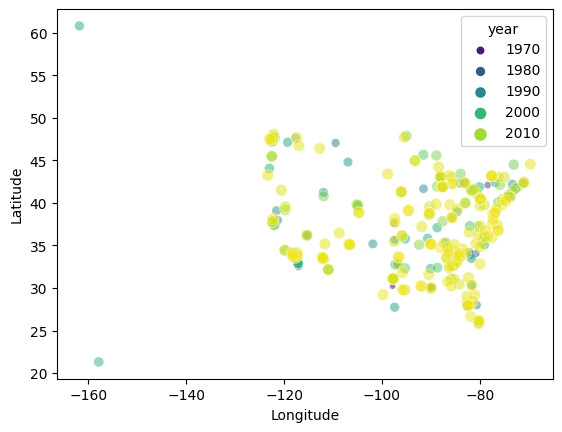

In [39]:
sns.scatterplot(data=final_ms_df, x="Longitude", y="Latitude",
                palette="viridis", hue = 'year', size ='year', alpha=0.5)

In [40]:
#view lat and longitude graph
fig = px.scatter_geo(final_ms_df,lat='Latitude',lon='Longitude')
fig.update_layout(title = 'Mass Shootings, 1966-2017', title_x=0.5)
fig.show()

From the above two graphs we can see that it appears most of the mass shootings are clustered on the east coast. 

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'Monday'),
  Text(1, 0, 'Tuesday'),
  Text(2, 0, 'Wednesday'),
  Text(3, 0, 'Thursday'),
  Text(4, 0, 'Friday'),
  Text(5, 0, 'Saturday'),
  Text(6, 0, 'Sunday')])

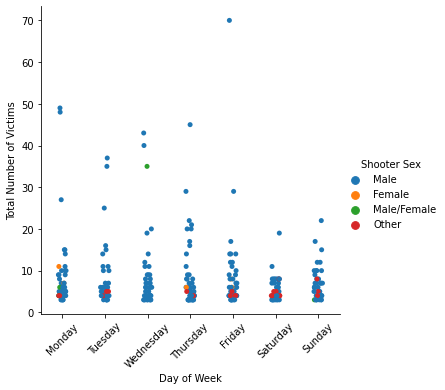

In [32]:
#visualize data by day of week
sns.catplot(x="Day of Week", y="Total Number of Victims", order=["Monday", "Tuesday", "Wednesday", "Thursday", "Friday",
                                                                "Saturday", "Sunday"], hue = 'Shooter Sex',data=final_ms_df)
plt.xticks(rotation=45)

Appears for all days of the week Males have the highest rate of being the shooter. It appears that Friday had the highest total number of victims overall; however, most days are clustered below 15 victims.

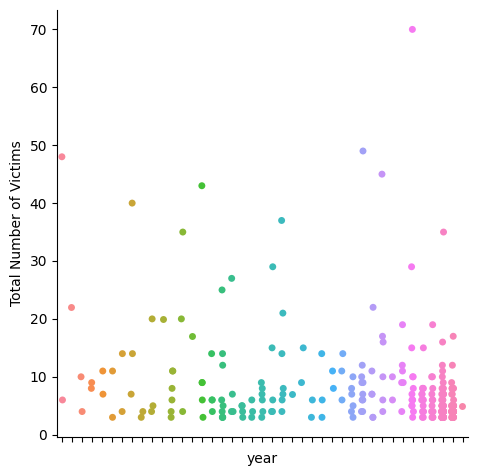

In [33]:
#visualize the data by year
ax = sns.catplot(x="year", y="Total Number of Victims",data=final_ms_df)
ax.set(xticklabels=[])

As we can see here in the earlier years the data points are more spread out. As we reach the later 2010s the data points become more dense indicating that mass shootings were becoming more common. 

In [34]:
#look at the total number of victims by year
year_group = final_ms_df.groupby('year')
year_group['Total Number of Victims'].sum()

year
1966     54
1972     22
1974     14
1976     17
1979     18
1982     14
1983     18
1984     61
1985      7
1986     29
1987     20
1988     43
1989     59
1990     17
1991     70
1992     30
1993     75
1994     42
1995     17
1996     13
1997     37
1998     58
1999     97
2000      7
2001     24
2002      9
2003     23
2004     19
2005     31
2006     37
2007    116
2008     53
2009     98
2010     16
2011     64
2012    184
2013    100
2014     88
2015    355
2016    336
2017      5
Name: Total Number of Victims, dtype: int64

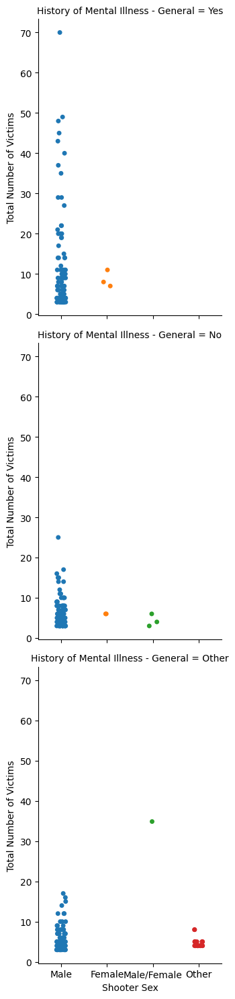

In [36]:
sns.catplot(x="Shooter Sex", y="Total Number of Victims",
            row="History of Mental Illness - General", hue = 'Shooter Sex', aspect=.7, data=final_ms_df)

Based on the plots above, male shooters with a history of mental illness were more likely to have a higher total victim count

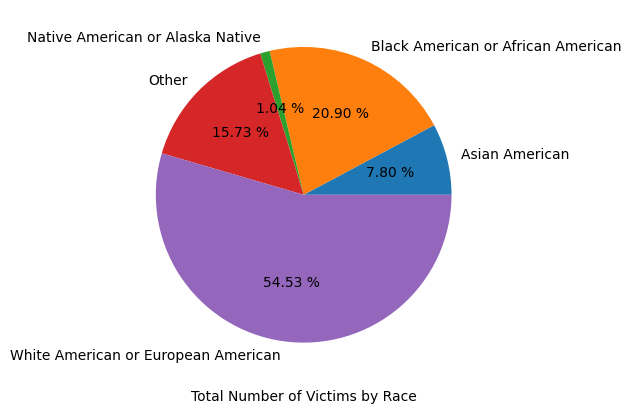

In [37]:
gb_race=final_ms_df.groupby(by="Shooter Race")[["Total Number of Victims"]].sum()
res_2=gb_race.reset_index()
plt.pie(x="Total Number of Victims", data=res_2, labels = 'Shooter Race', autopct="%.2f %%")
plt.xlabel("Total Number of Victims by Race")
plt.show()

We can see a large percentage of victims were the victim of a white or European American shooter.

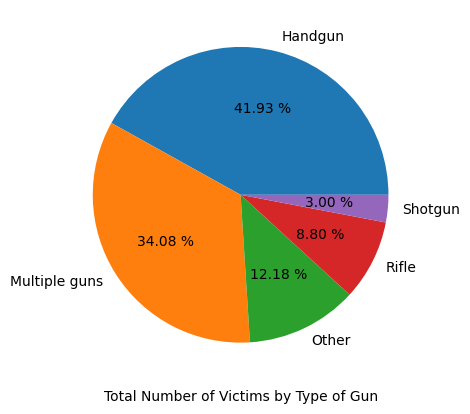

In [38]:
gb_gun=final_ms_df.groupby(by="Type of Gun - General")[["Total Number of Victims"]].sum()
res_3=gb_gun.reset_index()
plt.pie(x="Total Number of Victims", data=res_3, labels = 'Type of Gun - General', autopct="%.2f %%")
plt.xlabel("Total Number of Victims by Type of Gun")
plt.show()

In [49]:
first_25_df = final_ms_df[final_ms_df['year'] <= 2001.0 ]
last_25_df = final_ms_df[final_ms_df['year'] > 2001.0]


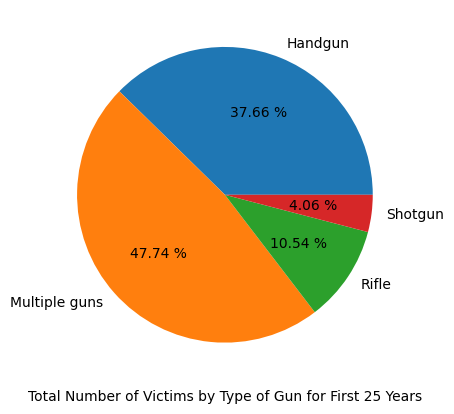

In [52]:
gb_gun2=first_25_df.groupby(by="Type of Gun - General")[["Total Number of Victims"]].sum()
res_4=gb_gun2.reset_index()
plt.pie(x="Total Number of Victims", data=res_4, labels = 'Type of Gun - General', autopct="%.2f %%")
plt.xlabel("Total Number of Victims by Type of Gun for First 25 Years")
plt.show()

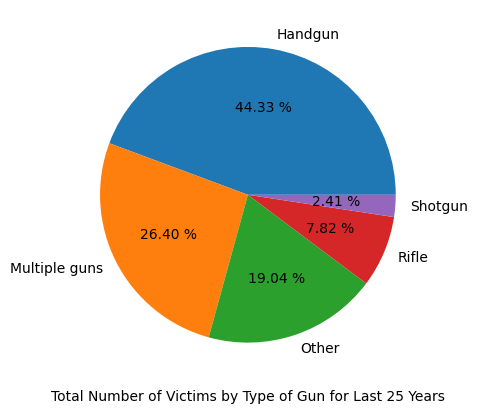

In [53]:
gb_gun3=last_25_df.groupby(by="Type of Gun - General")[["Total Number of Victims"]].sum()
res_5=gb_gun3.reset_index()
plt.pie(x="Total Number of Victims", data=res_5, labels = 'Type of Gun - General', autopct="%.2f %%")
plt.xlabel("Total Number of Victims by Type of Gun for Last 25 Years")
plt.show()

It appears that in the first 25 years it was more common for people to be the victim of multiple guns versus in the last 25 years. In the last 25 years the number of victims by hand gun increased. Overall it appears that handguns were the most common weapon used

In [125]:
#look at the motive
# nlp_sample = final_ms_df['Possible Motive - Detailed']
# nlp_sample

0      A task force of professionals known as the Con...
1      When he was being arrested, the shooter announ...
2      The shooter claimed he was subjected to two ye...
3      Former student, upset at being expelled and pl...
4      In a note explaining his motives Barbaro wrote...
                             ...                        
302                                                Other
303    Two groups of families were slashing each othe...
304                           Anger his ex-wife left him
305                                                Other
306                                   Social retaliation
Name: Possible Motive - Detailed, Length: 307, dtype: object

In [126]:
# for sample in nlp_sample:
#     print(sample)

A task force of professionals known as the Connally Commission was ordered to examine the shooter's autopsy findings to determine his possible motives. Their report states that his brain tumor "conceivably could have contributed to his inability to control his emotions and actions". 
When he was being arrested, the shooter announced: "I wanted to get known, just wanted to get myself a name". He was also diagnosed with schizophrenia. Mental illness, social, and two events in the summer of 1966 appear to have had an important role in transforming Smith from an oddball into a killer.
The shooter claimed he was subjected to two years of racial abuse during his time in the US Navy. After his discharge he became involved with black radicals in San Francisco, CA and later joined the New York Black Panthers. Before the attack, the shooter sent a letter to the local television station, announcing an attack to the police department citing the death of two innocent "brothers" as one of the main r

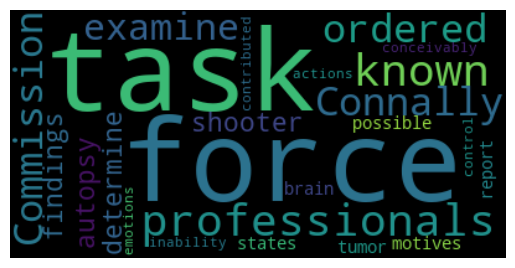

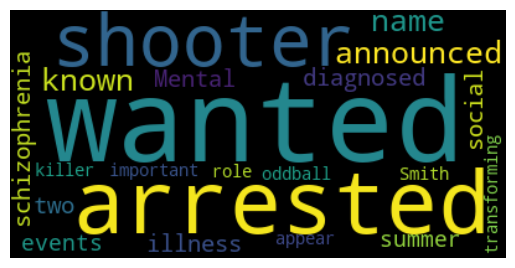

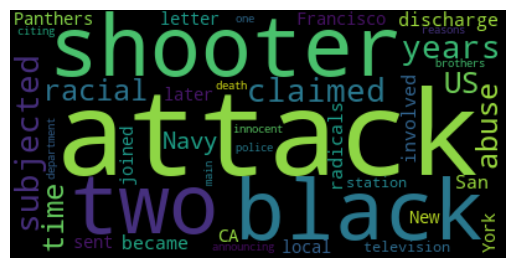

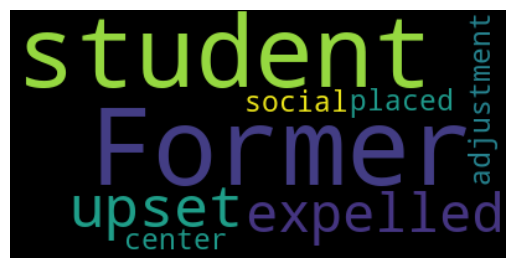

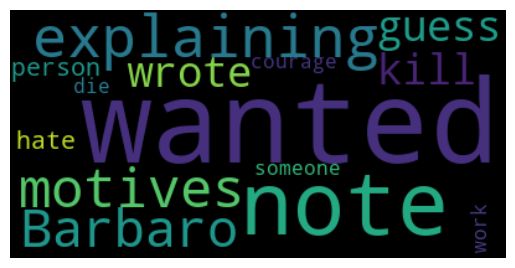

...

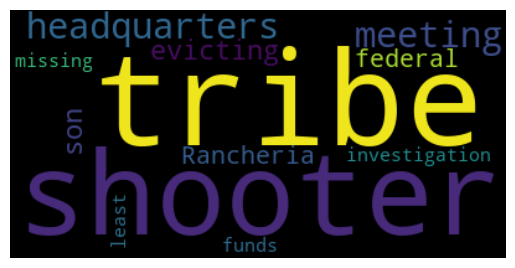

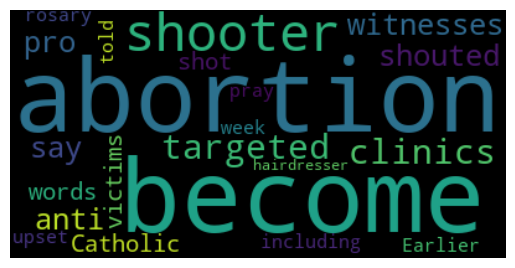

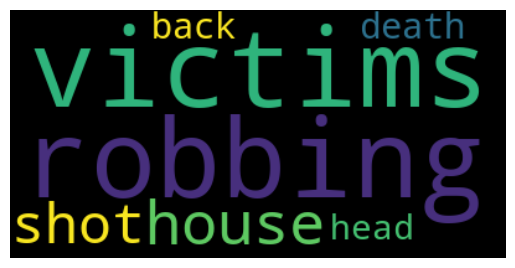

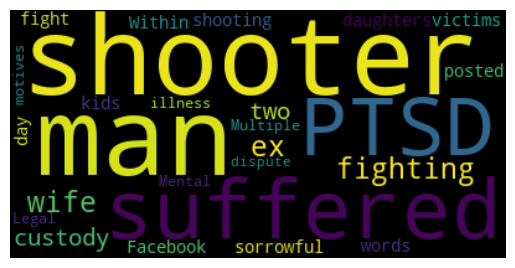

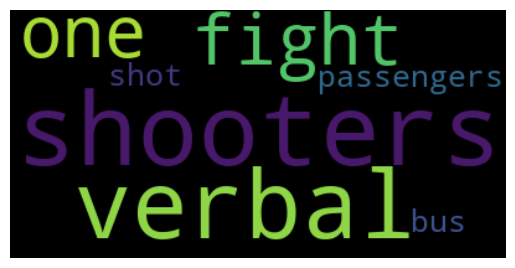

ValueError: We need at least 1 word to plot a word cloud, got 0.

In [144]:
# #remove stop words
# import nltk

# from nltk.corpus import stopwords
# from nltk.tokenize import word_tokenize
# from nltk.stem import WordNetLemmatizer
# from wordcloud import WordCloud
# import re
# stop_words = set(stopwords.words('english'))
  
# for sample in nlp_sample:
#     word_tokens = word_tokenize(sample)
  
#     filtered_sentence = [w for w in word_tokens if not w.lower() in stop_words]
  
#     filtered_sentence = []
  
#     for w in word_tokens:
#         if w not in stop_words:
#             filtered_sentence.append(w)

#     for word in filtered_sentence:
#         wn_lm= WordNetLemmatizer()
#         lm_word = wn_lm.lemmatize(word)
#         #print(word)
#     #visualize
    
#     # Display the generated image:
#     # the matplotlib way:
#     wordcloud = WordCloud().generate(sample)
#     import matplotlib.pyplot as plt
#     plt.imshow(wordcloud, interpolation='bilinear')
#     plt.axis("off")

#     plt.show()

The visualizations show that there are many possible motives behind mass shootings.